In [67]:
import numpy as np
import scipy.fft as fourier
import scipy.io.wavfile as wav
from IPython.display import Audio
import matplotlib.pyplot as plt
import cv2
import imageio

In [68]:
PORTION = 0.01 # ration for space to the spectogram audio
AMPLIFY_SOUND = 27000 # value to amplify a sound vector, its max value would be +/- 27000

def read_audio(path):
    """
    Reads a file
    inputs:
     * path: is the path to the audio file
     return:
      * fs: sample rate
      * signal: signal vector
    """
    fs, signal = wav.read(path)
    return fs, signal

def display_audio(fs, audio):
    """
    display an audio
    inputs:
    * fs: sample rate
    * audio: audio vector
    """
    display(Audio(audio, rate=fs))

def normalize_signal(signal):
    """
    normalizes a signal to be between -1 to 1
    inputs:
    * signal
    return:
    * normalized signal
    """
    return signal/np.max(abs(signal))

def plot_audio(fs, audio):
    """
    plots the audio
    inputs:
    * fs: sample rate
    * audio: audio vector
    """
    t = np.arange(0,len(audio)/fs,1/fs)
    if len(audio) != len(t):
        t = t[:-1]
    plt.plot(t,audio)
    plt.ylabel("Amplitude")
    plt.xlabel("Time")

def fft(signal):
    """
    does the fast fourier transform to a signal
    input:
    * signal
    return:
    * fft of the signal
    """
    return fourier.fft(signal)

def ifft(fft_vector):
    """
    does the inverse fast fourier transform to a signal
    input:
    * fft_vector: the fft of a signal
    return:
    * the real values of the ifft
    """
    return fourier.ifft(fft_vector).real
    

def read_image(path):
    """
    reads an image
    input:
    * path: image path
    return:
    * an array of the image
    """
    return imageio.v2.imread(path)
    
def plot_image(image,colorbar=False, axis=False):
    """
    plot a image
    input:
    * image: array of the image
    * colorbar (false): if is plotted the colobar
    * axis (false): if is plotted the axes
    """
    plt.imshow(image)
    if colorbar:
        plt.colorbar()
    if not axis:
        plt.axis('off')
    plt.show()
    
def float_image(image, multiplier=(1-PORTION)):
    """
    transform a image between 0 to 1 a then scaled by the multiplier.
    PORTION defines what is the portion that the spectrogram has for being hidden inside a image, the floats values of the final
    image will be between 0 to 1 so if the portion of the spectogram is 'PORTION' then the portion for the image will be the
    rest, ie, 1-PORTION
    inputs:
    * image
    * multiplier (1-PORTION)
    return:
    * image scaled
    """
    image = image.astype(np.float32) / 255.0 *multiplier
    return image

def fft_window(height, width, fs, signal):
    """
    creates a spectrogram looking for having the same height-width ratio of the input
    input:
    * height
    * width
    * fs: sample rate (is not necessary in this implementation)
    * signal: audio signal
    return:
    * spectrogram
    """
    samples_per_slice = int((height/width*len(signal))**(0.5))
    #samples_per_slice = int(fs * slice_duration)
    
    for i in range(0, len(signal), samples_per_slice):
        audio_slice = signal[i:i + samples_per_slice]

        slice_fft = fft(audio_slice)
        if (i==0):
            audio_fft_slices = slice_fft.reshape(slice_fft.size,1)
        else:
            if (slice_fft.size != len(audio_fft_slices)):
                break
            audio_fft_slices = np.hstack((audio_fft_slices,slice_fft.reshape((slice_fft.size,1))))
    return audio_fft_slices

def fft_window_split(spectrogram):
    """
    obtains the magnitude and phase of a spectogram
    input:
    * audio_fft_slices: spectrogram
    return:
    * magnitud_slice: magnitude of the spectogram
    * phase_slice: phase of the spectogram
    """
    magnitude_slice = np.abs(spectrogram)
    phase_slices = np.angle(spectrogram)
    
    return magnitude_slice, phase_slices

def reconstruct_fft_split(magnitude_slices,phase_slices):
    """
    reconstructs an audio signal from the magnitude and phase part of the spectrogram
    input:
    * magnitud_slices: magnitude of the spectrogram
    * phase_slices: phase part of the spectrogram
    return:
    * recovered audio signal
    """
    reconstructed_audio = np.array([])
    
    for mag_slice, phase_slice in zip(magnitude_slices.T, phase_slices.T):
        complex_spectrum = mag_slice * np.exp(1j * phase_slice)

        slice_ifft = ifft(complex_spectrum)

        reconstructed_audio = np.append(reconstructed_audio, slice_ifft.real)
    return reconstructed_audio

def reconstruct_fft(spectrogram):
    """
    recconstructs an audio signal from its spectrogram
    input:
    * spectrogram
    output:
    * recovered audio signal
    """
    reconstructed_audio = np.array([])
    
    for slice_fft in spectrogram:
        slice_ifft = ifft(slice_fft)
        
        reconstructed_audio = np.append(reconstructed_audio, slice_ifft.real)
    return reconstructed_audio

def normalize_magnitude(magnitude_spectrogram, multiplier=PORTION):
    """
    normalize the magnitude of a spectrogram and then scales it by multiplier
    intput:
    * magnitude_spectrogram
    return:
    * magnitude_spectrogram normalized and scaled
    """
    return magnitude_spectrogram/np.max(magnitude_spectrogram)*multiplier

def normalize_phase(phase_spectrogram, multiplier=PORTION):
    """
    normalize the phase of a spectrogram and then scales it by multiplier
    """
    return (phase_spectrogram/(2*np.pi)+0.5)*multiplier

def denormalize_phase(norm_phase, multiplier=PORTION):
    """
    applies the inverse process of 'normalize_phase' fuction
    input:
    * normalized_phase: normalized and scaled phase of a spectrogram
    output:
    * denormalized phase: original phase of a spectrogram
    """
    return (norm_phase/multiplier-0.5)*2*np.pi
    
def resize(image, width, height):
    """
    resize a image
    input:
    * image
    * width
    * height
    return
    * resized image
    """
    return cv2.resize(image, (width, height), interpolation = cv2.INTER_AREA)

def save_image(path, image):
    """
    save a image
    input:
    * path: path with the name of the image
    * image: image array
    """
    imageio.imsave(path, image)
    
def amplify_sound(audio,multiplier=AMPLIFY_SOUND):
    """
    implifies an audio multipler times
    input:
    * audio
    * multiplier
    return:
    * scaled audio
    """
    return audio*multiplier/np.max(abs(audio))

def save_audio(path, fs, audio):
    """
    save an audio
    input:
    * path: path and name of the audio
    * fs: sample rate
    * audio: audio vector
    """
    wav.write(path, fs, audio.astype(np.int16))
    
def mean_filter(signal, N):
    """
    applies a moving average filter to a signal
    input:
    * signal
    * N: number of averaged samples at a time
    return:
    * output of the system
    """
    return np.convolve(signal, np.ones(N)/N, mode='valid')

# ocultando audio

In [69]:
audio_path = "audios/high_hopes1.wav"
image_path = "imagenes/landscape.jpg"
carrier_path = "imagenes/carrier_image.tif"

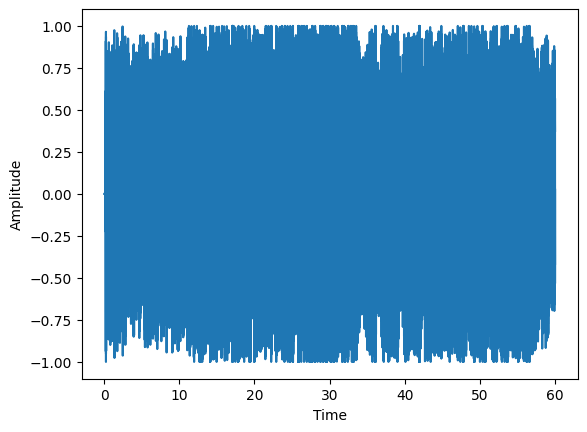

In [70]:
fs, audio = read_audio(audio_path)

#verify if the audio is stereo and take one channel
if (len(audio.shape) == 2):
    audio = audio[:,0]

audio = normalize_signal(audio)

display_audio(fs, audio)

plot_audio(fs, audio)

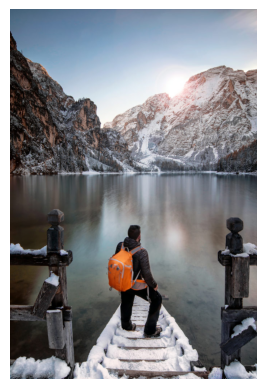

(1024, 683, 3)


In [71]:
image = read_image(image_path)
plot_image(image)
print(image.shape)

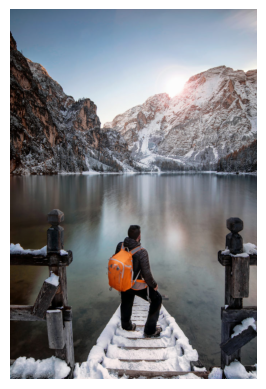

In [72]:
image_float = float_image(image)
plot_image(image_float)

In [73]:
audio_fft_slices = fft_window(*((image_float.shape)[0:2]), fs, audio)
mag_slices, phase_slices = fft_window_split(audio_fft_slices)

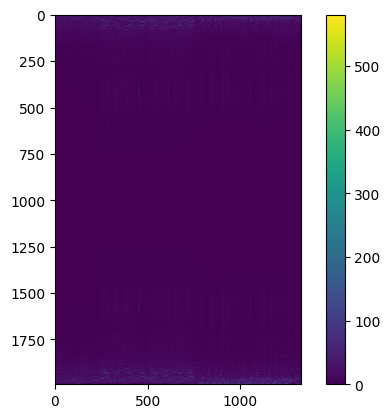

(1992, 1328)


In [74]:
plot_image(mag_slices, colorbar=True, axis=True)
print(mag_slices.shape)

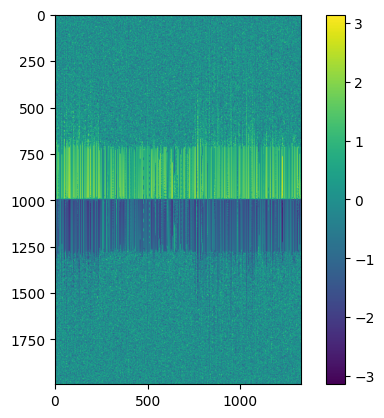

In [75]:
plot_image(phase_slices, colorbar=True, axis=True)

In [76]:
norm_mag = normalize_magnitude(mag_slices)
norm_phase = normalize_phase(phase_slices)

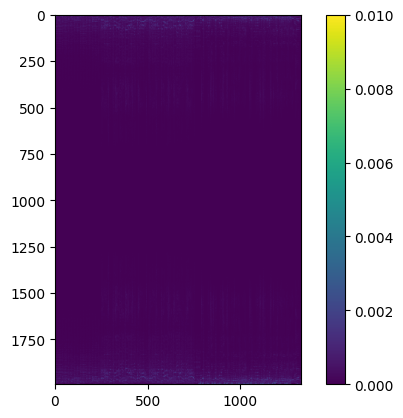

In [77]:
plot_image(norm_mag, colorbar=True, axis=True)

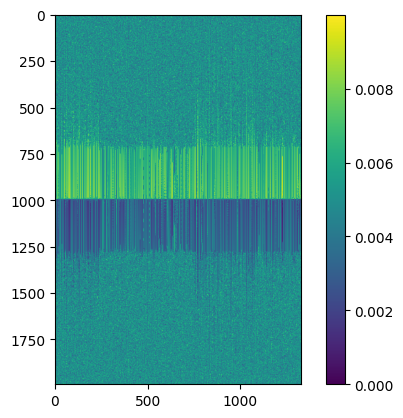

In [78]:
plot_image(norm_phase, colorbar=True, axis=True)

In [79]:
resized_image = resize(image_float, *((norm_mag.shape)[1::-1]))

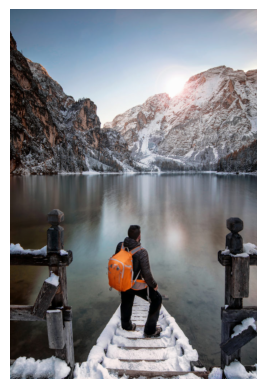

(1992, 1328, 3) (1992, 1328)


In [80]:
plot_image(resized_image)
print(resized_image.shape, norm_mag.shape)

In [81]:
carrier_image = resized_image.copy()
carrier_image[:,:,0] += norm_mag
carrier_image[:,:,1] += norm_phase
carrier_image[0,0,2] += 1/fs

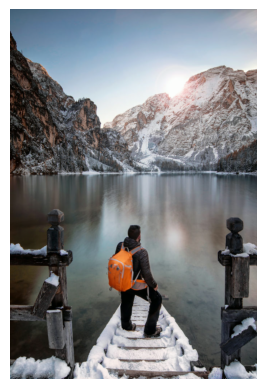

In [82]:
plot_image(carrier_image)

In [83]:
save_image(carrier_path, carrier_image)

# obteniendo audio

In [84]:
reconstructed_audio_path = "audios/reconstructed_audio.wav"

imagen con el audio


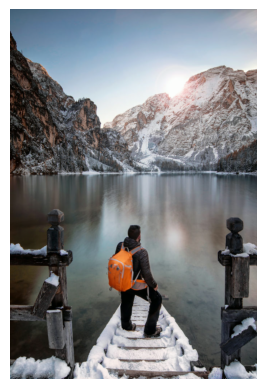

imagen 'llave'


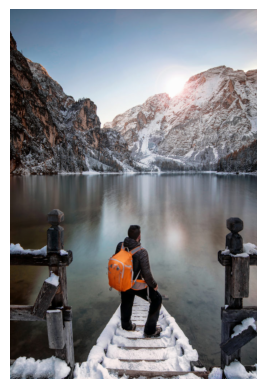

In [85]:
sus_image = read_image(carrier_path)
key = read_image(image_path)
key = float_image(key)
key = resize(key, *((sus_image.shape)[1::-1]))

print("imagen con el audio")
plot_image(sus_image)
print("imagen 'llave'")
plot_image(key)

In [86]:
audio_info = sus_image - key
recuperated_mag, recuperated_phase, third_layer = np.split(audio_info,3,axis=2)
recuperated_fs = int(1/third_layer[0,0])

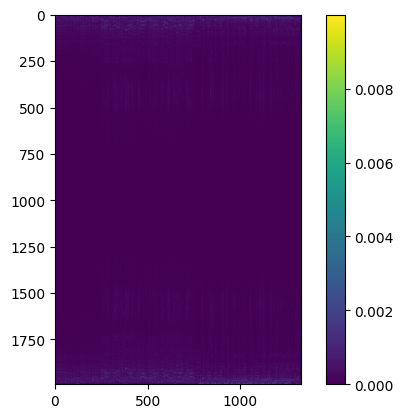

In [87]:
plot_image(recuperated_mag, colorbar=True, axis=True)

In [88]:
recuperated_phase = denormalize_phase(recuperated_phase)
reconstructed_audio = reconstruct_fft_split(recuperated_mag, recuperated_phase)
reconstructed_audio = amplify_sound(reconstructed_audio)
#reconstructed_audio = filter_audio(reconstructed_audio)

In [89]:
display_audio(recuperated_fs, reconstructed_audio)

In [90]:
save_audio(reconstructed_audio_path,recuperated_fs,reconstructed_audio)